In [ ]:
https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.spectrogram.html

In [ ]:
https://plot.ly/~giusbiSE/51/spectrogram/

# [plotly](https://stackoverflow.com/questions/38701969/dynamic-spectrum-using-plotly)

In [4]:
# Full example
# plotly offline
import plotly.offline as pyo
from plotly.offline import init_notebook_mode #to plot in jupyter notebook
import plotly.graph_objs as go
init_notebook_mode() # init plotly in jupyter notebook
import matplotlib.pyplot as plt
import numpy as np

from scipy.io import wavfile # scipy library to read wav files
AudioName = "vignesh.wav" # Audio File
fs, Audiodata = wavfile.read(AudioName)
Audiodata = Audiodata / (2.**15) # Normalized between [-1,1]

 #Spectrogram
from scipy import signal
plt.figure()
N = 512 #Number of point in the fft
w = signal.blackman(N)
freqs, bins, Pxx = signal.spectrogram(Audiodata, fs,window = w,nfft=N)

# Plot with plotly
trace = [go.Heatmap(
    x= bins,
    y= freqs,
    z= 10*np.log10(Pxx),
    colorscale='Jet',
    )]
layout = go.Layout(
    title = 'Spectrogram with plotly',
    yaxis = dict(title = 'Frequency'), # x-axis label
    xaxis = dict(title = 'Time'), # y-axis label
    )
fig = go.Figure(data=trace, layout=layout)
pyo.iplot(fig, filename='Spectrogram')

# [stingray](https://stingray.readthedocs.io/en/latest/notebooks/DynamicalPowerspectrum/DynamicalPowerspectrum_tutorial_[fake_data].html)

In [55]:

# import some modules
import numpy as np
import matplotlib.pyplot as plt
import stingray
import numpy as np
from stingray import Lightcurve, Crossspectrum, AveragedCrossspectrum

import matplotlib.pyplot as plt
import matplotlib.font_manager as font_manager
%matplotlib inline
font_prop = font_manager.FontProperties(size=16)
# choose style of plots, `seaborn-talk` produce nice big figures
plt.style.use('seaborn-talk')

In [6]:
# Array of timestamps, 10000 bins from 1s to 100s
times = np.linspace(1,100,10000)

# base component of the lightcurve, poisson-like
# the averaged count-rate is 100 counts/bin
noise = np.random.poisson(100,10000)

# time evolution of the frequency of our fake periodic signal
# the frequency changes with a sinusoidal shape around the value 24Hz
freq = 25 + 1.2*np.sin(2*np.pi*times/130)

# Our fake periodic variability with drifting frequency
# the amplitude of this variability is 10% of the base flux
var = 10*np.sin(2*np.pi*freq*times)

# The signal of our lightcurve is equal the base flux plus the variable flux
signal = noise+var

In [37]:
#%matplotlib inline
# Create the lightcurve object
lc = stingray.Lightcurve(times, signal)

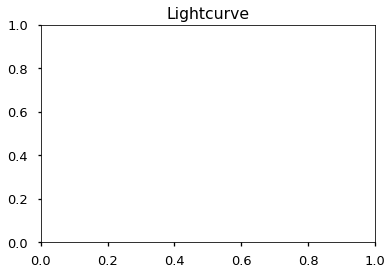

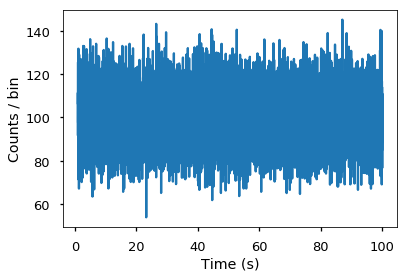

In [38]:
#plt.figure()
plt.title('Lightcurve')
lc.plot(labels=['Time (s)', 'Counts / bin'])
#plt.show()

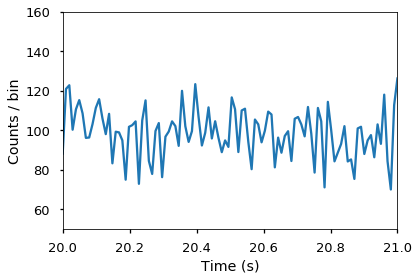

Text(0.5, 1.0, 'Zoomed in Lightcurve')

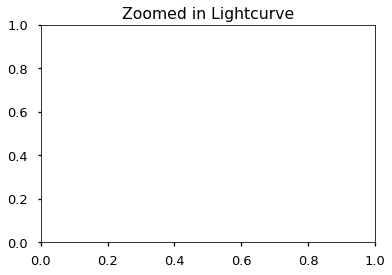

In [41]:
#plt.figure()
lc.plot(labels=['Time (s)', 'Counts / bin'], axis=[20,21,50,160])
plt.title('Zoomed in Lightcurve')
#plt.show()

In [42]:
ps = stingray.AveragedPowerspectrum(lc, segment_size=3, norm='leahy')

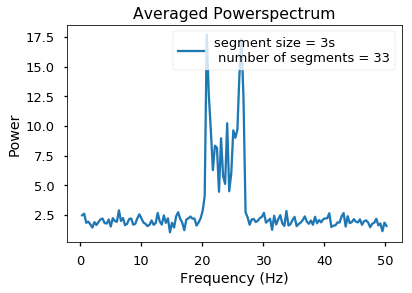

In [43]:
plt.plot(ps.freq, ps.power, label='segment size = {}s \n number of segments = {}'.format(3, int(lc.tseg/3)))
plt.title('Averaged Powerspectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.legend()

In [44]:
dps = stingray.DynamicalPowerspectrum(lc, segment_size=3)

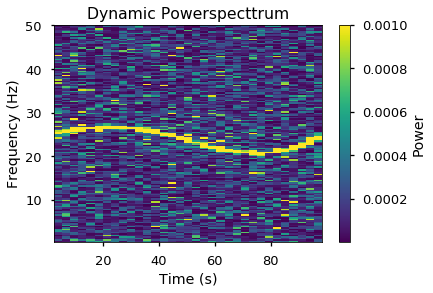

In [45]:
extent = min(dps.time), max(dps.time), min(dps.freq), max(dps.freq)
plt.imshow(dps.dyn_ps, aspect="auto", origin="lower", vmax=0.001,
           interpolation="none", extent=extent)
plt.title('Dynamic Powerspecttrum')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.colorbar(label='Power')

Cross Spectra

In [49]:

dt = 0.03125  # seconds
exposure = 8.  # seconds
times = np.arange(0, exposure, dt)  # seconds

signal_1 = 300 * np.sin(2.*np.pi*times/0.5) + 1000  # counts/s
signal_2 = 200 * np.sin(2.*np.pi*times/0.5 + np.pi/4) + 900  # counts/s
noisy_1 = np.random.poisson(signal_1*dt)  # counts
noisy_2 = np.random.poisson(signal_2*dt)  # counts

In [51]:
noisy_1.size

256

In [53]:
exposure/dt

256.0

In [56]:
lc1 = Lightcurve(times, noisy_1)
lc2 = Lightcurve(times, noisy_2)

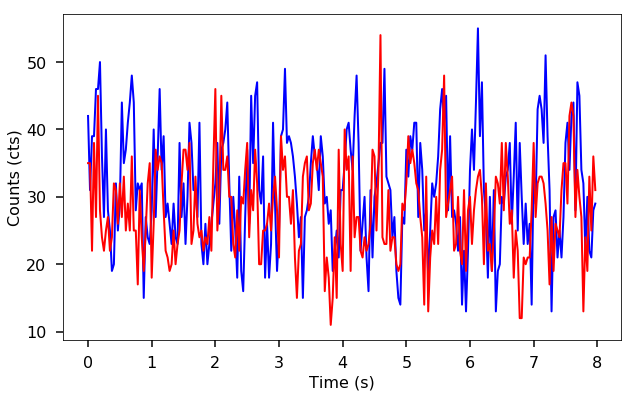

In [57]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(lc1.time, lc1.counts, lw=2, color='blue')
ax.plot(lc1.time, lc2.counts, lw=2, color='red')
ax.set_xlabel("Time (s)", fontproperties=font_prop)
ax.set_ylabel("Counts (cts)", fontproperties=font_prop)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
ax.tick_params(which='major', width=1.5, length=7)
ax.tick_params(which='minor', width=1.5, length=4)
plt.show()

Time lags / phase lags
1. Frequency-dependent lags

/Users/brettlv/anaconda3/lib/python3.6/site-packages/stingray/utils.py:89: UserWarning:

SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.

/Users/brettlv/anaconda3/lib/python3.6/site-packages/stingray/utils.py:89: UserWarning:

SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.

/Users/brettlv/anaconda3/lib/python3.6/site-packages/stingray/utils.py:89: UserWarning:

SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.

/Users/brettlv/anaconda3/lib/python3.6/site-packages/stingray/utils.py:89: UserWarning:

SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.

/Users/brettlv/anaconda3/lib/python3.6/site-packages/stingray/utils.py:89: UserWarning:

SIMON says: Errorbars on cross spectra are not thoroughly tested. Please report any inconsistencies.

/Users/brettlv/anaconda3/lib/python3.6/site-p

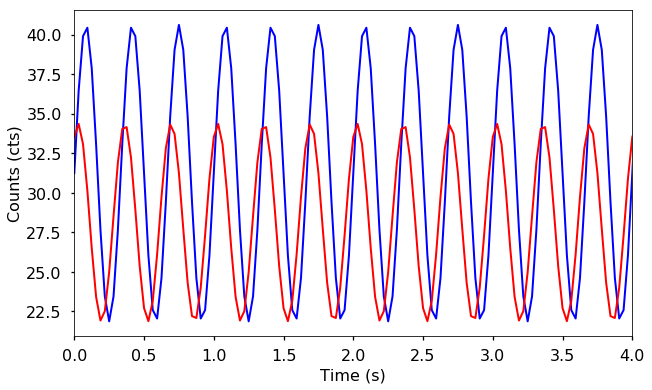

In [61]:
long_dt = 0.03125  # seconds
long_exposure = 1600.  # seconds
long_times = np.arange(0, long_exposure, long_dt)  # seconds

# long_signal_1 = 300 * np.sin(2.*np.pi*long_times/0.5) + 100 * np.sin(2.*np.pi*long_times*5 + np.pi/6) + 1000
# long_signal_2 = 200 * np.sin(2.*np.pi*long_times/0.5 + np.pi/4) + 80 * np.sin(2.*np.pi*long_times*5) + 900

long_signal_1 = (300 * np.sin(2.*np.pi*long_times*3) + 1000) * dt
long_signal_2 = (200 * np.sin(2.*np.pi*long_times*3 + np.pi/3) + 900) * dt

long_lc1 = Lightcurve(long_times, long_signal_1)
long_lc2 = Lightcurve(long_times, long_signal_2)

avg_cs = AveragedCrossspectrum(long_lc1, long_lc2, 8.)

fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(long_lc1.time, long_lc1.counts, lw=2, color='blue')
ax.plot(long_lc1.time, long_lc2.counts, lw=2, color='red')
ax.set_xlim(0,4)
ax.set_xlabel("Time (s)", fontproperties=font_prop)
ax.set_ylabel("Counts (cts)", fontproperties=font_prop)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)
plt.show()



/Users/brettlv/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning:

Casting complex values to real discards the imaginary part



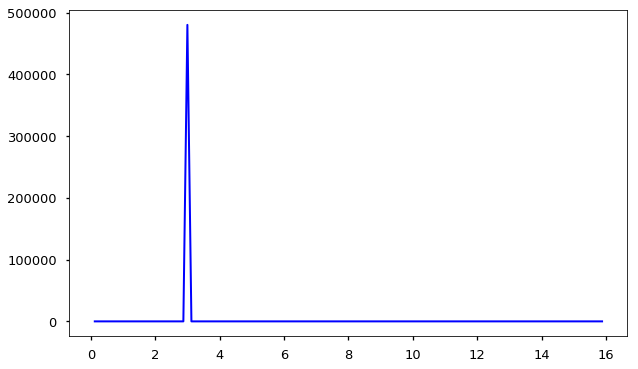

In [62]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
ax.plot(avg_cs.freq, avg_cs.power, lw=2, color='blue')

In [63]:
freq_lags, freq_lags_err = avg_cs.time_lag()

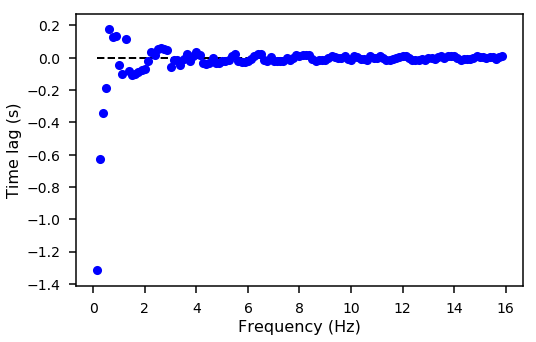

In [64]:
fig, ax = plt.subplots(1,1,figsize=(8,5))
ax.hlines(0, avg_cs.freq[0], avg_cs.freq[-1], color='black', linestyle='dashed', lw=2)
ax.errorbar(avg_cs.freq, freq_lags, yerr=freq_lags_err,fmt="o", lw=1, color='blue')
ax.set_xlabel("Frequency (Hz)", fontproperties=font_prop)
ax.set_ylabel("Time lag (s)", fontproperties=font_prop)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)
ax.tick_params(which='major', width=1.5, length=7)
ax.tick_params(which='minor', width=1.5, length=4)
for axis in ['top', 'bottom', 'left', 'right']:
    ax.spines[axis].set_linewidth(1.5)
plt.show()